In [15]:
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import pyplot
import matplotlib.dates as mdates
import datetime

In [27]:
dfw = pd.read_csv('dfw.csv')
dfw = dfw.drop(['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1'], axis = 1)

dfw = dfw[dfw['WIDTH'] != 0]
dfw = dfw[dfw['HEIGHT'] != 0]

dfw['VOLUME'] = dfw['LENGTH'] * dfw['WIDTH']
dfw['DENSITY'] = dfw['WEIGHT'] / dfw['VOLUME']

dfw['CREATIONTIME'] = pd.to_datetime(dfw['CREATIONTIME'])

dfw.head()

KeyboardInterrupt: 

In [17]:
dfw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12280952 entries, 0 to 12281091
Data columns (total 10 columns):
 #   Column        Dtype         
---  ------        -----         
 0   PARCELKEY     int64         
 1   FACILITYNAME  object        
 2   MACHINEID     int64         
 3   CREATIONTIME  datetime64[ns]
 4   LENGTH        float64       
 5   WIDTH         float64       
 6   HEIGHT        float64       
 7   WEIGHT        float64       
 8   VOLUME        float64       
 9   DENSITY       float64       
dtypes: datetime64[ns](1), float64(6), int64(2), object(1)
memory usage: 1.0+ GB


In [18]:
d = datetime.date(2021, 5, 1)
d = pd.to_datetime(d)
dfw = dfw[dfw['CREATIONTIME'] >= d]
dfw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4705983 entries, 0 to 4706022
Data columns (total 10 columns):
 #   Column        Dtype         
---  ------        -----         
 0   PARCELKEY     int64         
 1   FACILITYNAME  object        
 2   MACHINEID     int64         
 3   CREATIONTIME  datetime64[ns]
 4   LENGTH        float64       
 5   WIDTH         float64       
 6   HEIGHT        float64       
 7   WEIGHT        float64       
 8   VOLUME        float64       
 9   DENSITY       float64       
dtypes: datetime64[ns](1), float64(6), int64(2), object(1)
memory usage: 394.9+ MB


### Dealing with densities above the 75th percentile

In [25]:
# Package counts above 75

dfw_density = dfw[dfw['DENSITY'] > (dfw['DENSITY'].quantile(q = .75))]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high.csv')

In [26]:
# Package counts above 75, normalized

dfw_d_high_norm = pd.DataFrame()
dfw_d_high_norm = dfw_d_high

dfw_d_high_norm['NORM'] = ( dfw_d_high_norm['DENSITY'] - dfw_d_high_norm['DENSITY'].mean() ) / ( dfw_d_high_norm['DENSITY'].std() )

dfw_d_high_norm['NORM'] = dfw_d_high_norm['NORM'] - dfw_d_high_norm['NORM'].min()
dfw_d_high_norm['NORM'] = dfw_d_high_norm['NORM'] * 100

dfw_d_high_norm = dfw_d_high_norm.drop('DENSITY', axis = 1)

dfw_d_high_norm.to_csv('dfw_d_high_norm.csv')

##### Sensitivity testing - increasing weight by percentage (with non-normalized data)

In [21]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] * 1.05
        
    count += 1

created temp dataframe
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
in

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance found
instance f

In [22]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [39]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_up_5.csv')

In [40]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] * 1.10
        
    count += 1

In [41]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [42]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_up_10.csv')

In [43]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] * 1.20
        
    count += 1

In [44]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [45]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_up_20.csv')

##### Sensitivity testing - decreasing weight by percentage (with non-normalized data)

  for some reason, this code is resulting in a much higher package count than it should be.... something's def off.... (opposite of what I'd expect, package count above the cutoff should be dropping)

In [46]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] * .95
        
    count += 1

In [47]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [48]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_down_5.csv')

In [49]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] * .90
        
    count += 1

KeyboardInterrupt: 

In [ ]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [ ]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_down_10.csv')

In [ ]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] * .80
        
    count += 1

In [ ]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [ ]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_down_20.csv')

##### Sensitivity testing - increasing weight by offset (with non-normalized data)

<AxesSubplot:>

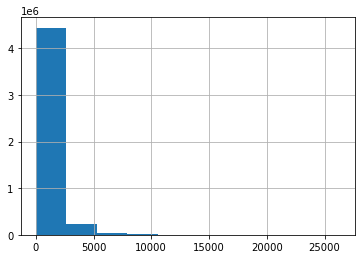

In [52]:
dfw['WEIGHT'].hist()

In [53]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] + 50
        
    count += 1

In [54]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [55]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_up_50.csv')

In [57]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] + 25
        
    count += 1

In [58]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [59]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_up_25.csv')

In [60]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] + 10
        
    count += 1

In [61]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [62]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_up_10g.csv')

##### Sensitivity testing - decreasing weight by offset (with non-normalized data)

In [ ]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] - 50
        
    count += 1

In [ ]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [ ]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_down_50.csv')

In [ ]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] - 25
        
    count += 1

In [ ]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [ ]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_down_25.csv')

In [ ]:
import datetime

quantile = dfw['DENSITY'].quantile(.75)

dfw_temp = dfw

count = 0
d = datetime.date(2021, 6, 21)

for row in dfw_temp.T.iteritems():

    if dfw_temp.iat[count, 3] > d:
        dfw_temp.iat[count, 7] = dfw_temp.iat[count, 7] - 10
        
    count += 1

In [ ]:
dfw_temp['DENSITY'] = dfw_temp['WEIGHT'] / dfw_temp['VOLUME']

In [ ]:
dfw_density = dfw_temp[dfw_temp['DENSITY'] > quantile]

dfw_density7 = dfw_density[dfw_density['MACHINEID'] == 7]
dfw_density8 = dfw_density[dfw_density['MACHINEID'] == 8]

dfw7_d_high = pd.DataFrame()
dfw7_d_high = dfw_density7.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw7_d_high[['CREATIONTIME', 'DENSITY']] = dfw7_d_high[['CREATIONTIME', 'DENSITY']]
dfw7_d_high['MACHINEID'] = 7

dfw8_d_high = pd.DataFrame()
dfw8_d_high = dfw_density8.resample('3H', on = 'CREATIONTIME').agg({'DENSITY': 'count'}).reset_index()
dfw8_d_high[['CREATIONTIME', 'DENSITY']] = dfw8_d_high[['CREATIONTIME', 'DENSITY']]
dfw8_d_high['MACHINEID'] = 8

dfw_d_high = pd.DataFrame()
dfw_d_high = dfw_d_high.append(dfw7_d_high)
dfw_d_high = dfw_d_high.append(dfw8_d_high)

dfw_d_high.to_csv('dfw_d_high_weight_down_10g.csv')